In [1]:
import pandas as pd
import numpy as np
from os.path import exists
from os import mkdir
from os import listdir
from matplotlib import pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as cols
import matplotlib.gridspec as grid_spec
import scipy
import re
import csv as csv
from itertools import cycle
from sklearn.neighbors import KernelDensity
from matplotlib.colors import Normalize
from matplotlib.offsetbox import AnchoredText
import proplot as pplt
#install.packages("viridis")
#library(viridis)


mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["legend.fontsize"] = 12
mpl.rcParams["font.size"] = 12

# import matplotlib.tri as mtri

# from scipy.interpolate import griddata

PLOTDIR = "plots"
DATADIR = "data"

DIRS = [PLOTDIR, DATADIR]

def plot_savepath(filename):
    return PLOTDIR + f"/{filename}"

def data_path(filename):
    return DATADIR + f"/{filename}"

for d in DIRS:
    if not exists(d):
        mkdir(d)
        
        
#  output_dir = f"figures/experiments/"
#     Path(output_dir).mkdir(parents=True, exist_ok=True)

#data files are shown as AICS-31 1857 Dots (1)

In [2]:
#Here we import files with "positional data" from organoids ie. the position of cancer cells and organoid loci
#shown as XYC coordinated. These could be exported from Imaris Oxford Instruments or another source.

#In our examples...
#Files containing the position of cancer cells include "Dots" in their name,
#whereas files containing the position of organoid loci include "Vol" in their name

#Cell Line: SUPB15
df = pd.read_excel(data_path('HW8D60SUPB15_DOTS_1.xls'), header = None, skiprows =1)
#We drop irrelevant columns from our dataset which would otherwise have no purpose in our script.
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_SUPB15_D = df

print(df)

df = pd.read_excel(data_path('HW8D60SUPB15_VOL_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_SUPB15_V = df

print(df)

#Cell Line: 1857
df = pd.read_excel(data_path('DOTS_1857_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_1857_D = df

print(df_1857_D)

df = pd.read_excel(data_path('VOL_1857_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_1857_V = df

print(df_1857_V)

df = pd.read_excel(data_path('HW8D60697_DOTS_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_697_D = df


print(df)

#Cell Line: 697
df = pd.read_excel(data_path('HW8D60697_VOL_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_697_V = df


print(df)

#Cell Line: Kasumi2
df = pd.read_excel(data_path('HW8D60KASUMI2_DOTS_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_Kasumi2_D = df


print(df)

df = pd.read_excel(data_path('HW8D60KASUMI2_VOL_1.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_Kasumi2_V = df


print(df)

#Cell Line: CD34
df = pd.read_excel(data_path('Day_10_CD34__14_Days_DOTS.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_CD34_D = df


print(df)

df = pd.read_excel(data_path('Day_10_CD34__14_Days_VOL.xls'), header = None, skiprows =1)
df = df.rename(columns = df.iloc[0]).drop(df.index[0])
df_CD34_V = df


print(df)

FileNotFoundError: [Errno 2] No such file or directory: 'data/HW8D60SUPB15_DOTS_1.xls'

In [ ]:
#Here we declare in which columns the x, y, and z coordinates are located

x = df_SUPB15_D["Position X"]
y = df_SUPB15_D["Position Y"]
z = df_SUPB15_D["Position Z"]

xb = df_SUPB15_V["Position X"]
yb = df_SUPB15_V["Position Y"]
zb = df_SUPB15_V["Position Z"]

xc = df_1857_D["Position X"]
yc = df_1857_D["Position Y"]
zc = df_1857_D["Position Z"]

xd = df_1857_V["Position X"]
yd = df_1857_V["Position Y"]
zd = df_1857_V["Position Z"]

xe = df_697_D["Position X"]
ye = df_697_D["Position Y"]
ze = df_697_D["Position Z"]

xf = df_697_V["Position X"]
yf = df_697_V["Position Y"]
zf = df_697_V["Position Z"]

xg = df_Kasumi2_D["Position X"]
yg = df_Kasumi2_D["Position Y"]
zg = df_Kasumi2_D["Position Z"]

xh = df_Kasumi2_V["Position X"]
yh = df_Kasumi2_V["Position Y"]
zh = df_Kasumi2_V["Position Z"]

xi = df_CD34_D["Position X"]
yi = df_CD34_D["Position Y"]
zi = df_CD34_D["Position Z"]

xj = df_CD34_V["Position X"]
yj = df_CD34_V["Position Y"]
zj = df_CD34_V["Position Z"]

In [ ]:
#Here we create a scatter plot of three cell lines from our data collection (SUPB15. 697, Kasumi2).

fig, axs  = plt.subplots(3, 3, figsize=(18,14))
gs = fig.add_gridspec(3, 3, hspace=0, wspace=0)


def alpha_cmap(cmap):
    my_cmap = cmap(np.arange(cmap.N))
    # Set a square root alpha.
    my_cmap[:,0] = np.linspace(0, 5, cmap.N)
    my_cmap = cols.ListedColormap(my_cmap)

    return cmap

#norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap="GnBu")
sn = plt.cm.ScalarMappable(cmap="Reds")

#GnBu
axs[0,0].scatter(x, y, marker=".", c=z, cmap="GnBu", alpha=1.0, s=10, linewidth=0.2, label="CFSE")
axs[0,0].scatter(xb, yb, marker=".", c=zb, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[0,1].scatter(x, z, marker=".", c=z, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[0,1].scatter(xb, zb, marker=".", c=zb, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[0,2].scatter(y, z, marker=".", c=z, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[0,2].scatter(yb, zb, marker=".", c=zb, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[1,0].scatter(xe, ye, marker=".", c=ze, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,0].scatter(xf, yf, marker=".", c=zf, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[1,1].scatter(xe, ze, marker=".", c=ze, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,1].scatter(xf, zf, marker=".", c=zf, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[1,2].scatter(ye, ze, marker=".", c=ze, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,2].scatter(yf, zf, marker=".", c=zf, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[2,0].scatter(xg, yg, marker=".", c=zg, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[2,0].scatter(xh, yh, marker=".", c=zh, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[2,1].scatter(xg, zg, marker=".", c=zg, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[2,1].scatter(xh, zh, marker=".", c=zh, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

axs[2,2].scatter(yg, zg, marker=".", c=zg, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[2,2].scatter(yh, zh, marker=".", c=zh, cmap="Reds", alpha=0.2, s=4, linewidth=0.3, label="MAP2")

plt.colorbar(sm, ax=axs[0,0], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,0], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[0,1], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,1], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[0,2], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,2], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,0], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,0], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,1], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,1], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,2], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,2], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[2,0], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[2,0], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[2,1], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[2,1], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[2,2], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[2,2], label = 'Position of MAP2 Events along Z-Axis/A.U.')


at = AnchoredText(
    "SUPB15 (BCR-ABL1)", prop=dict(size=8), frameon=True, loc='upper left')
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
axs[0,0].add_artist(at)

at2 = AnchoredText(
    "697 (TCF3-PBX1)", prop=dict(size=8), frameon=True, loc='upper left')
at2.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
axs[1,0].add_artist(at2)

at3 = AnchoredText(
    "Kasumi2 (TCF3-PBX1)", prop=dict(size=8), frameon=True, loc='upper left')
at3.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
axs[2,0].add_artist(at3)


#axs[0,0].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=False, shadow=False, title = "SUPB15 (BCR-ABL1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[0,1].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "SUPB15 (BCR-ABL1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[0,2].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "SUPB15 (BCR-ABL1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[1,0].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "1857 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[1,1].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "1857 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[1,2].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "1857 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[2,0].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "697 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[2,1].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "697 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[2,2].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "697 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[3,0].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "Kasumi2 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[3,1].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "Kasumi2 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[3,2].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "Kasumi2 (TCF3-PBX1)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[4,0].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "HSC (CD34+)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[4,1].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "HSC (CD34+)", fontsize = 10, markerscale=5, title_fontsize = "10")
#axs[4,2].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
#                mode="expand", borderaxespad=0,
#          ncol=3, fancybox=True, shadow=False, title = "HSC (CD34+)", fontsize = 10, markerscale=5, title_fontsize = "10")


axs[0, 0].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[0, 0].set_ylabel('Position Y (\u03bcm)', fontweight ='bold')

axs[0, 1].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[0, 1].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[0, 2].set_xlabel('Position Y (\u03bcm)', fontweight ='bold')
axs[0, 2].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[1, 0].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[1, 0].set_ylabel('Position Y (\u03bcm)', fontweight ='bold')

axs[1, 1].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[1, 1].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[1, 2].set_xlabel('Position Y (\u03bcm)', fontweight ='bold')
axs[1, 2].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[2, 0].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[2, 0].set_ylabel('Position Y (\u03bcm)', fontweight ='bold')

axs[2, 1].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[2, 1].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[2, 2].set_xlabel('Position Y (\u03bcm)', fontweight ='bold')
axs[2, 2].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

texts = ['J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R']
ax = fig.get_axes()
for a,l in zip(ax, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=35, weight = 'bold')
#plt.suptitle('Label_Distance Consistent', fontsize = 20)


fig.tight_layout()
plt.savefig(plot_savepath('GridPlot_SUPB15_697_Kasumi2.pdf'), bbox_inches='tight')
plt.savefig(plot_savepath('GridPlot_SUPB15_697_Kasumi2.png'),dpi=300, bbox_inches='tight')

plt.show()

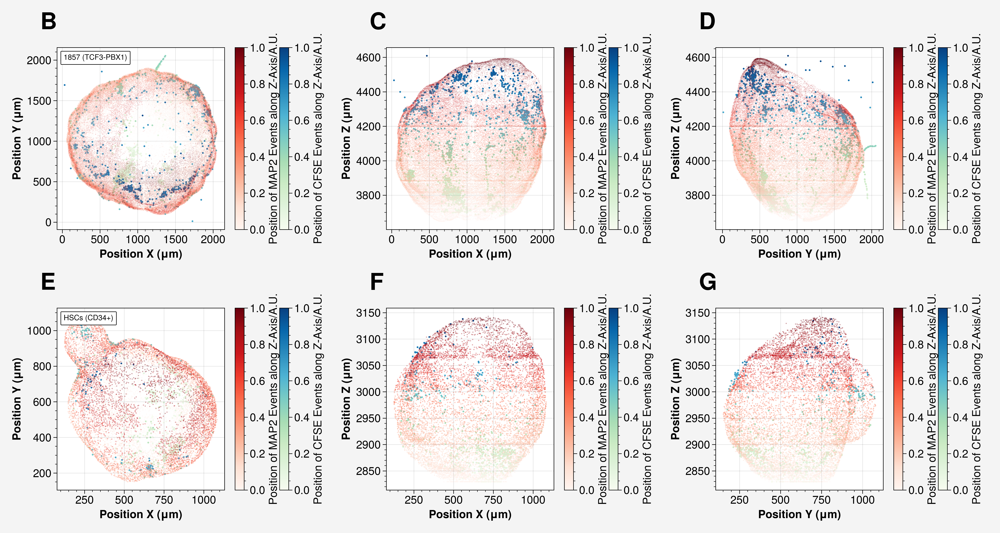

In [21]:
#Here we create a scatter plot of two of our cell lines from our data collection (1857, CD34).
fig, axs  = plt.subplots(2, 3, figsize=(15, 8))
gs = fig.add_gridspec(2, 3, hspace=0, wspace=0)
#plt.style.use("seaborn")
#plt.rcParams["figure.autolayout"] = True
#fig.suptitle('SUPB15 (BCR-ABL1)', fontsize = 10, fontweight ='bold')

def alpha_cmap(cmap):
    my_cmap = cmap(np.arange(cmap.N))
    # Set a square root alpha.
    my_cmap[:,-1] = np.linspace(0, 6, cmap.N)
    my_cmap = cols.ListedColormap(my_cmap)

    return my_cmap

sm = plt.cm.ScalarMappable(cmap="GnBu")
sn = plt.cm.ScalarMappable(cmap="Reds")
    #Greys
    #tab20b

axs[0,0].scatter(xc, yc, marker=".", c=zc, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[0,0].scatter(xd, yd, marker=".", c=zd, cmap="Reds", alpha=0.1, s=2, linewidth=0.3, label="MAP2")

axs[0,1].scatter(xc, zc, marker=".", c=zc, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[0,1].scatter(xd, zd, marker=".", c=zd, cmap="Reds", alpha=0.1, s=2, linewidth=0.3, label="MAP2")

axs[0,2].scatter(yc, zc, marker=".", c=zc, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[0,2].scatter(yd, zd, marker=".", c=zd, cmap="Reds", alpha=0.1, s=2, linewidth=0.3, label="MAP2")

axs[1,0].scatter(xi, yi, marker=".", c=zi, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,0].scatter(xj, yj, marker=".", c=zj, cmap="Reds", alpha=0.3, s=4, linewidth=0.3, label="MAP2")

axs[1,1].scatter(xi, zi, marker=".", c=zi, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,1].scatter(xj, zj, marker=".", c=zj, cmap="Reds", alpha=0.3, s=4, linewidth=0.3, label="MAP2")

axs[1,2].scatter(yi, zi, marker=".", c=zi, cmap="GnBu", alpha=1.0, s=10, linewidth=0.3, label="CFSE")
axs[1,2].scatter(yj, zj, marker=".", c=zj, cmap="Reds", alpha=0.3, s=4, linewidth=0.3, label="MAP2")

plt.colorbar(sm, ax=axs[0,0], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,0], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[0,1], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,1], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[0,2], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[0,2], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,0], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,0], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,1], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,1], label = 'Position of MAP2 Events along Z-Axis/A.U.')
plt.colorbar(sm, ax=axs[1,2], label = 'Position of CFSE Events along Z-Axis/A.U.')
plt.colorbar(sn, ax=axs[1,2], label = 'Position of MAP2 Events along Z-Axis/A.U.')


at = AnchoredText(
    "1857 (TCF3-PBX1)", prop=dict(size=8), frameon=True, loc='upper left')
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
axs[0,0].add_artist(at)

at2 = AnchoredText(
    "HSCs (CD34+)", prop=dict(size=8), frameon=True, loc='upper left')
at2.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
axs[1,0].add_artist(at2)


axs[0, 0].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[0, 0].set_ylabel('Position Y (\u03bcm)', fontweight ='bold')

axs[0, 1].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[0, 1].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[0, 2].set_xlabel('Position Y (\u03bcm)', fontweight ='bold')
axs[0, 2].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[1, 0].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[1, 0].set_ylabel('Position Y (\u03bcm)', fontweight ='bold')

axs[1, 1].set_xlabel('Position X (\u03bcm)', fontweight ='bold')
axs[1, 1].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')

axs[1, 2].set_xlabel('Position Y (\u03bcm)', fontweight ='bold')
axs[1, 2].set_ylabel('Position Z (\u03bcm)', fontweight ='bold')


texts = ['B', 'C', 'D', 'E', 'F', 'G']
ax = fig.get_axes()
for a,l in zip(ax, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=25, weight = 'bold')
#plt.suptitle('Label_Distance Consistent', fontsize = 20)


fig.tight_layout()
plt.savefig(plot_savepath('GridPlot_1857vsHSCs.pdf'), bbox_inches='tight')
plt.savefig(plot_savepath('GridPlot_1857vsHSCs.png'),dpi=300, bbox_inches='tight')

plt.show()